# Exploratory Data Analysis - EDA

The EDA uses the RadiometryTrios package to read the Radiometry Database<br>

In [29]:
%load_ext autoreload
%autoreload 2

import plotly.express as px
# from WaterClassification.core import *

from RadiometryTrios import TriosMDB, RadiometryGroup, RadiometryDB, BaseRadiometry
from RadiometryTrios.common import all_wls, s2bands, s3bands
import pandas as pd
import numpy as np

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# GetDB - Database GETDB

> This notebook explains the utilization of the `RadiometryDB` responsible for opening and manipulating a Radiometry db <br>
> It also presents a brief Exploratory Data Analysis (EDA)

In [4]:
RadiometryDB?

Init signature: RadiometryDB(path, config=None)
Docstring:      Class responsible for loading a Radiometry Database and manipulating it.
Init docstring: Open the radiometry DB located in specified folder
File:           d:\onedrive - agência nacional de águas\projects\radiometrytrios\radiometrytrios\radiometry_db.py
Type:           type
Subclasses:     


## Checking all data available in the database

In [5]:
db = RadiometryDB(r'D:\OneDrive - Agência Nacional de Águas\Data\GET-RadiometryDB')
db.summary()

,Radiometry,SPM,POC,DOC,Chl-a,Granul,Kd
Area,,,,,,,
Madeira,185,185,0,0,2,66,38
Negro,177,166,51,63,2,1,10
Solimoes_Amazonas,121,121,0,0,20,29,59
Paranoa,119,119,0,0,0,0,0
Sao_Francisco,99,98,0,0,0,0,0
Maroni,82,82,0,0,0,0,0
Ucayali,62,59,0,0,0,5,4
Acudes,58,55,0,0,57,0,0
Amazon_Floodplains,46,46,0,0,30,0,8


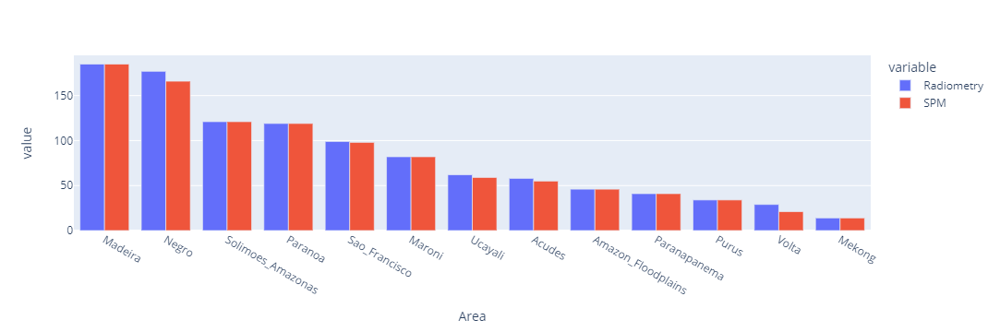

In [6]:
db.summary(plot=True, bars=['SPM'], total=False)

### Plotting other variables

In [7]:
db.summary?

Signature: db.summary(by='Area', plot=False, bars=None, total=True, **kwargs)
Docstring:
Create a summary DataFrame to present all data stored in the database
:param bars: The name of the bars to include in the plot.
This can be 'SPM', 'POC', 'DOC', 'Chl-a', 'Granul', 'Kd'
:param plot: Instead of returning a DataFrame, return a plotly bar fig
File:      d:\onedrive - agência nacional de águas\projects\radiometrytrios\radiometrytrios\radiometry_db.py
Type:      method


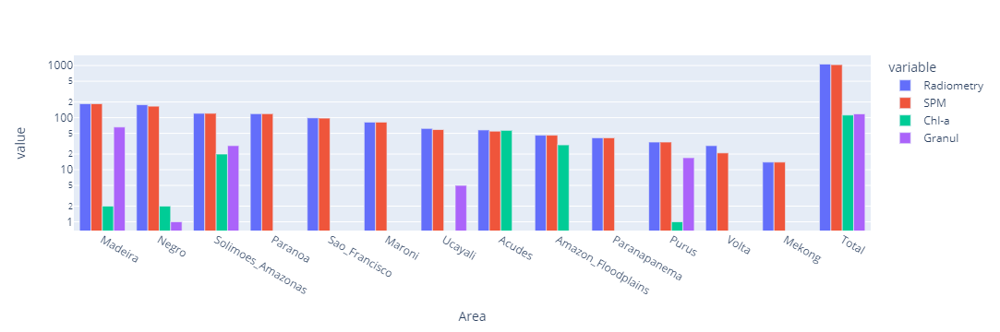

In [8]:
db.summary(plot=True, bars=['SPM', 'Chl-a', 'Granul'], log_y=True)

In [9]:
db.summary(by='Status')

,Radiometry,SPM,POC,DOC,Chl-a,Granul,Kd
Status,,,,,,,
Ok,941,941,51,63,64,108,97
SPM Suspicious,59,59,0,0,45,5,24
SPM Missing,25,0,0,0,2,0,0
Suspicious,23,23,0,0,0,2,3
Deleted,19,18,0,0,1,3,3
Total,1067,1041,51,63,112,118,127


# Load individual radiometries

In [10]:
db.load_radiometry?

Signature:
db.load_radiometry(
    idx=None,
    folder=None,
    area=None,
    station=None,
    measurement=None,
    load_interpolated=True,
    read_backup=False,
)
Docstring:
Load a specific radiometry from the database and returns a HyperspectralTrios class
The load radiometry function can work with either:
- database Id
- description: area, station and measurement ( in the format YYYYMMDD-hhmm)
- folder: if we know the folder (absolute or relative) of the measurement in the database
File:      d:\onedrive - agência nacional de águas\projects\radiometrytrios\radiometrytrios\radiometry_db.py
Type:      method


In [11]:
# # Here we present 4 different ways to open a specific radiometry

# # loading with the description
rdmtry = db.load_radiometry(area="Madeira", station="Madeira_Foz", measurement="20091128-1640")

# loading with the Id
rdmtry = db.load_radiometry(idx=958)

# loading with the absolute folder
rdmtry = db.load_radiometry(folder=r'D:\OneDrive - Agência Nacional de Águas\Data\GET-RadiometryDB\Madeira\Madeira_Foz\20091128-1640')

# loading with the relative folder
rdmtry = db.load_radiometry(folder=r'Madeira\Madeira_Foz\20091128-1640')

rdmtry

Class Radiometry
Raw radiometries: ['Ed', 'Ld', 'Lu'] 
Interpolated radiometries: ['Rrs', 'Ed', 'Ld', 'Lu'] 
Metadata: True
Folder: D:\OneDrive - Agência Nacional de Águas\Data\GET-RadiometryDB\Madeira\Madeira_Foz\20091128-1640 

# Plotting the Graphs

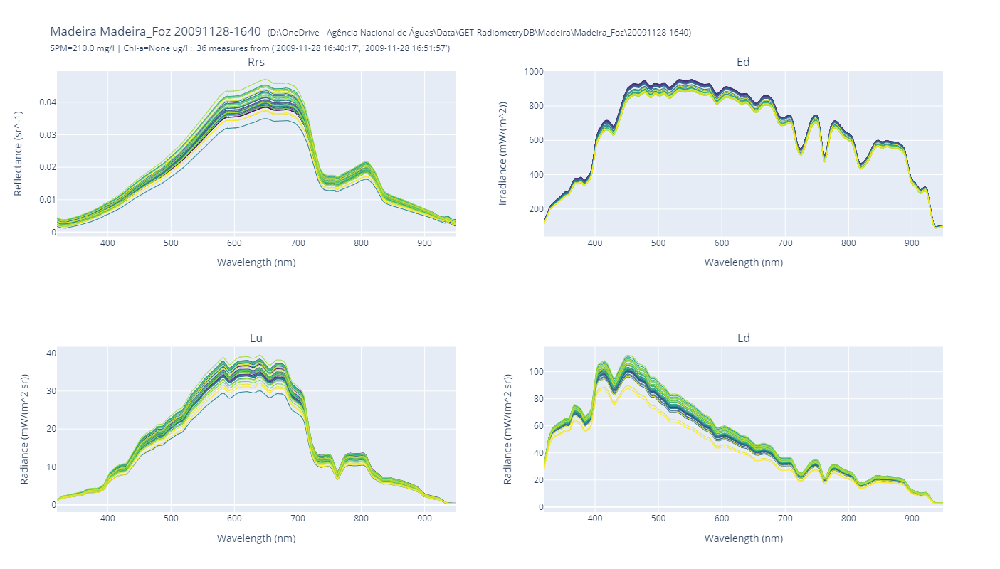

In [21]:
rdmtry.plot_radiometries()

# Loading Mean Radiometries from the Database
Instead of loading each individual set of radiometries for a specific measurement, it is possible to open the summarized radiometries from all measurements in the database.<br>
The load_summary function load the mean radiometries. The results will be stored in the `.rdmtries` attribute.<br>
<b>Note that the mean radiometries are pre-processed, so if the summary is not updated, one should run `db.create_summary_radiometries` function to reprocess it.</b>

## update mean radiometries

In [11]:
db.create_summary_radiometries?

Signature: db.create_summary_radiometries(r_types=None, attrs=None)
Docstring:
Create the files xxx summary.csv for the r_types indicated. These files are necessary to load
the mean radiometries of the database. The attributes will be stored in the final .csv
this function.
r_types are ['Rrs', 'Ed', 'Ld', 'Lu']
File:      d:\onedrive - agência nacional de águas\projects\waterclassification\src\triosradiometrypkg\triosradiometry\radiometry_db.py
Type:      method


In [22]:
# db.create_summary_radiometries()

## Loading Mean Radiometries
The load_summary function load the mean radiometries. The results will be stored in the .rdmtries attribute.

In [23]:
db.load_radiometries()

Radiometries ['Rrs', 'Ed', 'Ld', 'Lu'] loaded in dictionary .rdmtries


In [24]:
db.rdmtries['Rrs'].head()

,Area_2,Station_2,Measurement,Start_Date_2,SPM_2,Status_2,Description_2,319,320,321,...,Lat,Long,GMT,SummerTime,OBS,Relative_Path,Start_Date,End_Date,Project,Description
Id,,,,,,,,,,,,,,,,,,,,,
0,Paranoa,Ponto_1,20160318-1139,2016-03-18 11:39:00,7.0,Ok,GIANCARLO_ CAMP1_1,NaN,0.003272,0.003054,...,-15.746431,-48.207141,-3,1,NaN,Descoberto/Ponto_1/20160318-1139,2016-03-18 11:39:00,2016-03-18 11:42:00,AQUASENSE,GIANCARLO_ CAMP1_1
1,Paranoa,Ponto_2,20160318-1214,2016-03-18 12:14:00,8.4,Ok,GIANCARLO_ CAMP1_2,NaN,0.002663,0.002460,...,-15.746431,-48.207141,-3,1,NaN,Descoberto/Ponto_2/20160318-1214,2016-03-18 12:14:00,2016-03-18 12:21:00,AQUASENSE,GIANCARLO_ CAMP1_2
2,Paranoa,Ponto_3,20160318-1228,2016-03-18 12:28:00,5.8,Ok,GIANCARLO_ CAMP1_3,NaN,0.003356,0.003116,...,-15.746431,-48.207141,-3,1,NaN,Descoberto/Ponto_3/20160318-1228,2016-03-18 12:28:00,2016-03-18 12:32:00,AQUASENSE,GIANCARLO_ CAMP1_3
3,Paranoa,Ponto_4,20160318-1325,2016-03-18 13:25:00,6.2,Ok,GIANCARLO_ CAMP1_4,NaN,0.003155,0.002964,...,-15.746431,-48.207141,-3,1,NaN,Descoberto/Ponto_4/20160318-1325,2016-03-18 13:25:00,2016-03-18 13:28:00,AQUASENSE,GIANCARLO_ CAMP1_4
4,Paranoa,Ponto_5,20160318-1347,2016-03-18 13:47:00,8.4,Ok,GIANCARLO_ CAMP1_5,NaN,0.001636,0.001477,...,-15.746431,-48.207141,-3,1,NaN,Descoberto/Ponto_5/20160318-1347,2016-03-18 13:47:00,2016-03-18 13:54:00,AQUASENSE,GIANCARLO_ CAMP1_5


# Data Exploration
## Plot some randomly selected measurements to check data

In [25]:
rrs = db.rdmtries['Rrs']

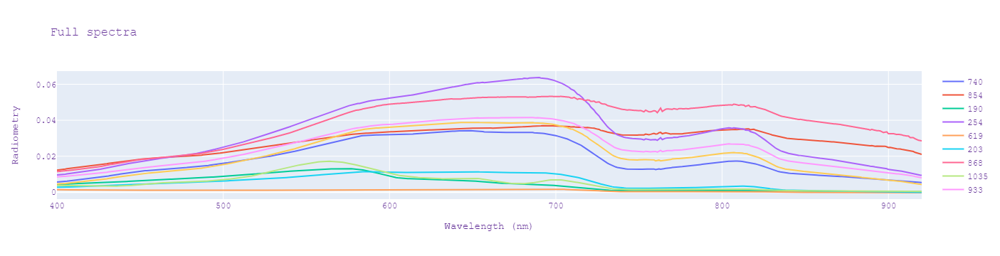

In [26]:
db.plot_ids(rrs, rrs.index[np.random.randint(0, len(rrs), 10)], hover_vars=['Area', 'Station'])

## Mean Spectra by Area
In this section we will plot the mean spectra by Area

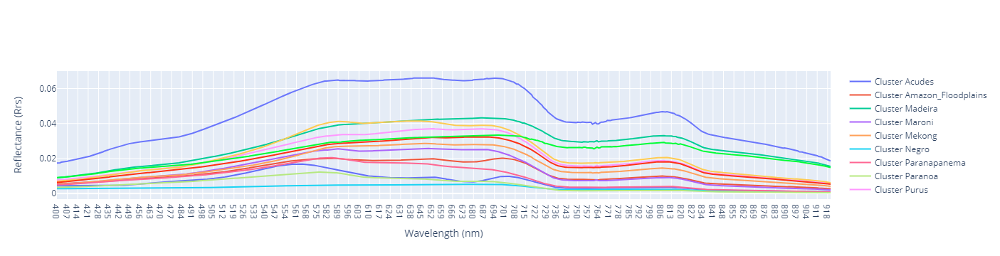

In [30]:
BaseRadiometry.plot_mean_reflectances(rrs, 'Area', all_wls, shaded=False)

## Calculating SPM stats by Area
* only areas with more than 5 measurements will be included in the statistics
* measurements with no SPM measurements will be excluded

In [31]:
# Deleting 0 SPM measurements
rrs = rrs[(~pd.isna(rrs['SPM'])) & (rrs['SPM'] > 0)]

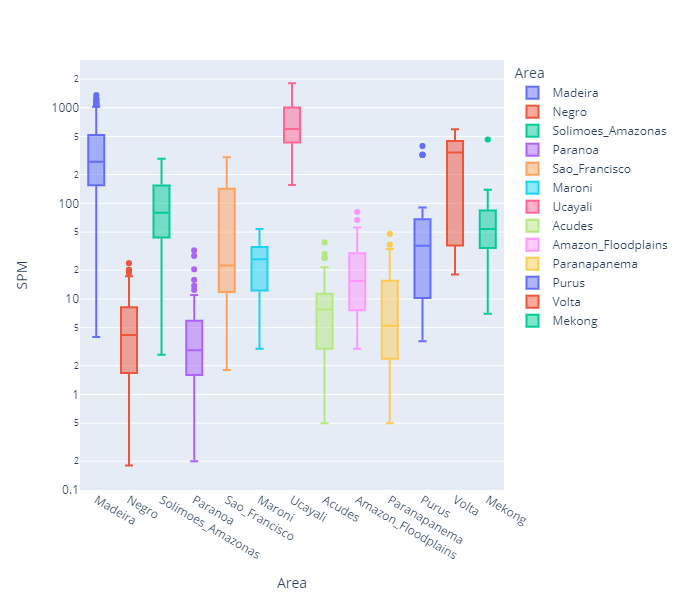

In [32]:
# calculating the stats of the database
stats = BaseRadiometry.calc_df_grouped_stats(rrs[['SPM', 'Area']], 'Area', ['SPM'], ['mean', 'max', 'min', 'std'], 
                              [pd.core.groupby.generic.DataFrameGroupBy.mean,
                               pd.core.groupby.generic.DataFrameGroupBy.max,
                               pd.core.groupby.generic.DataFrameGroupBy.min,
                               pd.core.groupby.generic.DataFrameGroupBy.std
                              ]
                             )


summary = db.summary()
grouped_df = pd.concat([summary, stats], axis=1, sort=False)

# selecting basins with more than 5 SPM measurements
spm_df = rrs[rrs['Area'].isin(grouped_df[grouped_df['SPM']>=5].index)]

# Setting the same order of basins as the previous graph
category_orders = {'Area': list(grouped_df[grouped_df['SPM']>=5].index)}

fig = px.box(spm_df, x='Area', y='SPM', color='Area', 
             category_orders=category_orders, range_y=[0, 1700], height=600)

fig.update_yaxes(type='log', range=[-1, 3.5])
fig

# Plotting Reflectance Scatters

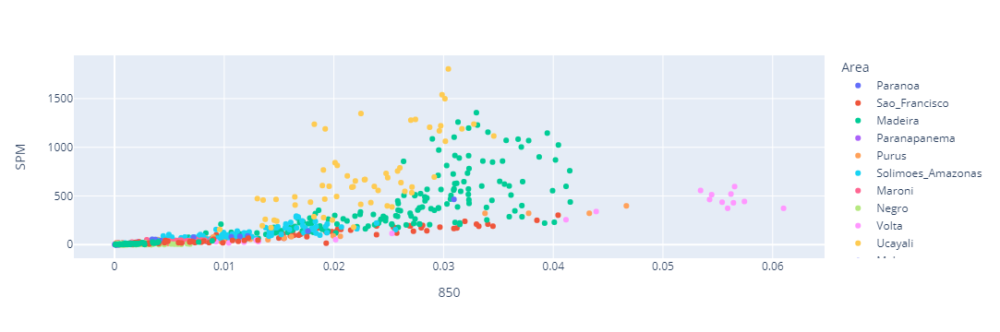

In [39]:
px.scatter(rrs, x='850', y='SPM', color='Area', log_y=False, hover_data=[rrs.index], render_mode='svg')

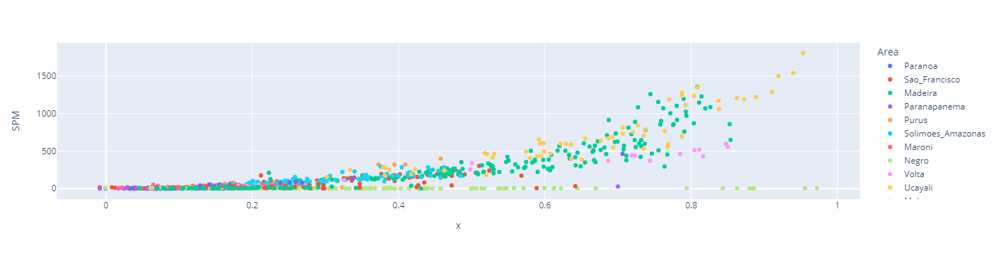

In [34]:
# the ratio 865/665 can solve part of the dispersion
# before that, we will clean negative reflectances
rrs = rrs[rrs['850']>0]
rrs = rrs[rrs['665']>0]
px.scatter(rrs, x=rrs['865']/rrs['665'], y='SPM', color='Area', log_y=False)

It's clear from the graph that low SPM concentrations are not corrected by using the 865/665 ratio

# Analysing the area (total brightness) of the reflectance

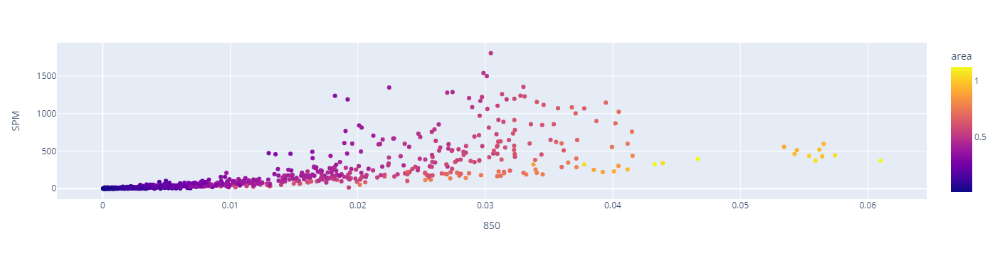

In [40]:
rrs = BaseRadiometry.calc_area(rrs, bands=s3bands)
px.scatter(rrs, x='850', y='SPM', color='area', log_y=False)

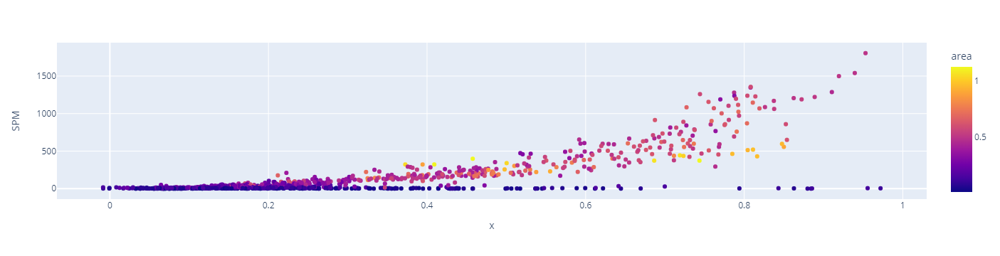

In [41]:
px.scatter(rrs, x=rrs['865']/rrs['665'], y='SPM', color='area', log_y=False)

In [42]:
rrs = BaseRadiometry.calc_area(rrs, bands=s3bands, col_name='flatness', norm_band='700')

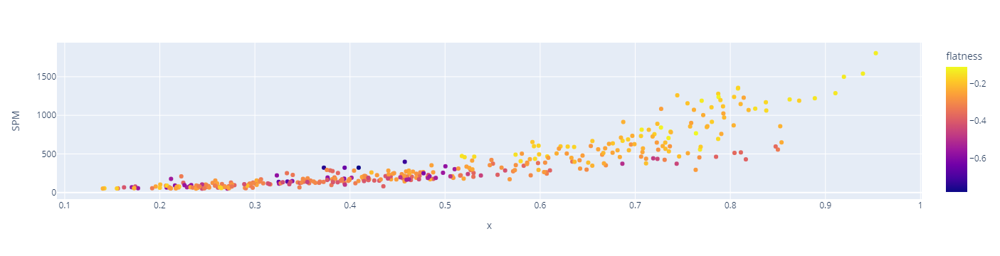

In [43]:
high_SPM = rrs[rrs['SPM']> 50] 
px.scatter(high_SPM, x=high_SPM['865']/high_SPM['665'], y='SPM', color='flatness', log_y=False)

## Plotting radiometries from an Area

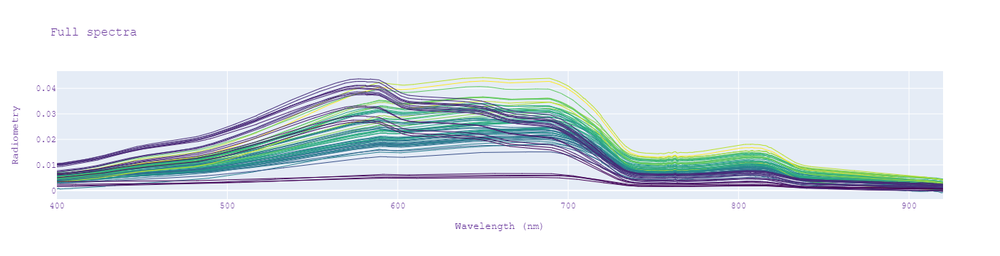

In [44]:
area = rrs[rrs['Area']=='Maroni']

BaseRadiometry.plot_reflectances(area, all_wls, hover_vars=['Area', 'SPM'], color='SPM', discrete=False)

# Scratch Area

In [45]:
import geopandas
import matplotlib.pyplot as plt

ModuleNotFoundError: No module named 'geopandas'

In [42]:
%matplotlib inline

In [10]:
world = geopandas.read_file(geopandas.datasets.get_path('naturalearth_lowres'))
cities = geopandas.read_file(geopandas.datasets.get_path('naturalearth_cities'))

12:00:31 ERROR:PROJ: proj_create_from_wkt: Cannot find proj.db
12:00:31 ERROR:PROJ: proj_identify: Cannot find proj.db
12:00:31 ERROR:PROJ: proj_as_wkt: Cannot find proj.db
12:00:31 ERROR:PROJ: proj_create_from_wkt: Cannot find proj.db
12:00:31 ERROR:PROJ: proj_identify: Cannot find proj.db
12:00:31 ERROR:PROJ: proj_as_wkt: Cannot find proj.db


<AxesSubplot:>

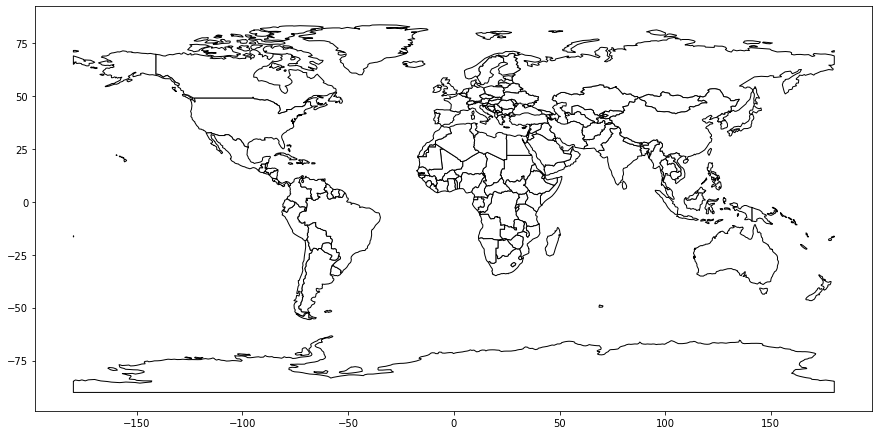

In [63]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_aspect('equal')

world.plot(ax=ax, color='white', edgecolor='black')
# cities.plot(ax=ax, marker='o', color='red', markersize=5)

In [58]:
stations = geopandas.GeoDataFrame(db.stations, geometry=geopandas.points_from_xy(db.stations.Long, db.stations.Lat))

In [71]:
stations.plot(ax=ax, marker='o', color='red', markersize=50)

<AxesSubplot:>

<Figure size 432x288 with 0 Axes>

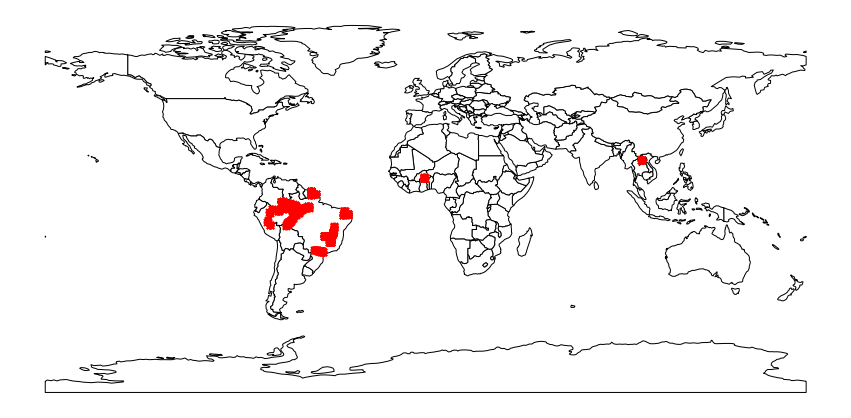

In [73]:
ax.set_axis_off()
fig

In [48]:
cities.plot(ax=ax, marker='*', color='green', markersize=5)

<AxesSubplot:>

<Figure size 432x288 with 0 Axes>

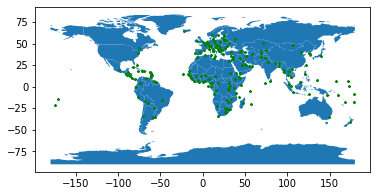

<Figure size 1080x720 with 0 Axes>

In [51]:
plt.figure(figsize=(15, 10))
fig

In [22]:
cities = cities.to_crs(world.crs)

<AxesSubplot:>

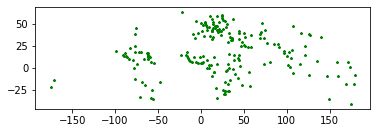

In [23]:
cities.plot(marker='*', color='green', markersize=5)

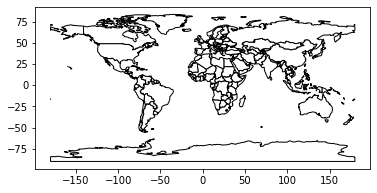

In [24]:
base = world.plot(color='white', edgecolor='black')

In [26]:
cities.plot(ax=base, marker='o', color='red', markersize=5);

<Figure size 432x288 with 0 Axes>

In [27]:
world.plot?

Signature:      world.plot(*args, **kwargs)
Type:           GeoplotAccessor
String form:    <geopandas.plotting.GeoplotAccessor object at 0x000002238D7A3438>
File:           d:\programs\anaconda\envs\waterclass\lib\site-packages\geopandas\plotting.py
Docstring:     
Plot a GeoDataFrame.

Generate a plot of a GeoDataFrame with matplotlib.  If a
column is specified, the plot coloring will be based on values
in that column.

Parameters
----------
column : str, np.array, pd.Series (default None)
    The name of the dataframe column, np.array, or pd.Series to be plotted.
    If np.array or pd.Series are used then it must have same length as
    dataframe. Values are used to color the plot. Ignored if `color` is
    also set.
kind: str
    The kind of plots to produce:
     - 'geo': Map (default)
     Pandas Kinds
     - 'line' : line plot
     - 'bar' : vertical bar plot
     - 'barh' : horizontal bar plot
     - 'hist' : histogram
     - 'box' : BoxPlot
     - 'kde' : Kernel Density Estima

In [ ]:
aaa

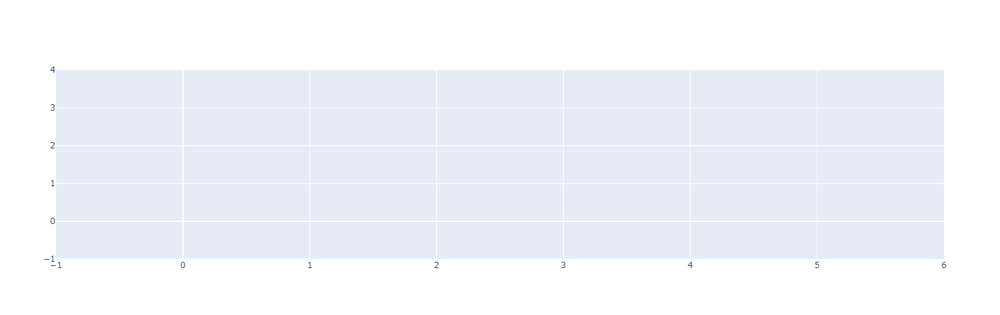

In [2]:
from plotly.graph_objects import Figure
Figure()

In [ ]:
kd = db.kd.join(db.data, lsuffix='_kd').join(db.granulometry, rsuffix='_granul')

In [ ]:
px.scatter(kd, x=665, y='SPM', color='D50')

In [ ]:
db.granulometry

In [ ]:
Figure()

In [76]:
'db' in globals()

True

In [ ]:
locals()

In [79]:
globals()

{'__name__': '__main__',
 '__doc__': 'Automatically created module for IPython interactive environment',
 '__package__': None,
 '__loader__': None,
 '__spec__': None,
 '__builtin__': <module 'builtins' (built-in)>,
 '__builtins__': <module 'builtins' (built-in)>,
 '_ih': ['',
  'import RadiometryTrios',
  "get_ipython().run_line_magic('load_ext', 'autoreload')\nget_ipython().run_line_magic('autoreload', '2')\n\nimport plotly.express as px\n# from WaterClassification.core import *\n\nfrom RadiometryTrios import TriosMDB, RadiometryGroup, RadiometryDB, BaseRadiometry\n# from TriosRadiometry.common import all_wls, s2bands, s3bands\nimport pandas as pd\nimport numpy as np",
  'import RadiometryTrios',
  "get_ipython().run_line_magic('pinfo', 'RadiometryDB')",
  "db = RadiometryDB(r'D:\\OneDrive - Agência Nacional de Águas\\Data\\GET-RadiometryDB')\ndb.summary()",
  "db.summary(plot=True, bars=['SPM'], total=False)",
  'import geopandas',
  "world = geopandas.read_file(geopandas.datasets.ge